<a href="https://colab.research.google.com/github/dami-os/Caravan-Insurance/blob/main/caravan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Prediction

**Challenge:** The data analytical task is to predict whether a customer is interested in a
caravan insurance policy from the data. 

+ You should first do some exploratory data analysis.  
+ Visualising the data should give you some insight into certain particularities of this dataset.   
+ Then prepare the data for data mining. It will be important to select the right features, and to construct new features from existing ones. 
+ Try out at least three different data mining algorithms.

In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

from sklearn.model_selection import cross_val_score

from sklearn.metrics import mean_squared_error

In [ ]:
## Exploratory Data Analysis

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Data/training_data.csv')

In [ ]:
df.head()

,MOSTYPE,MAANTHUI,MGEMOMV,MGEMLEEF,MOSHOOFD,MGODRK,MGODPR,MGODOV,MGODGE,MRELGE,MRELSA,MRELOV,MFALLEEN,MFGEKIND,MFWEKIND,MOPLHOOG,MOPLMIDD,MOPLLAAG,MBERHOOG,MBERZELF,MBERBOER,MBERMIDD,MBERARBG,MBERARBO,MSKA,MSKB1,MSKB2,MSKC,MSKD,MHHUUR,MHKOOP,MAUT1,MAUT2,MAUT0,MZFONDS,MZPART,MINKM30,MINK3045,MINK4575,MINK7512,...,PPERSAUT,PBESAUT,PMOTSCO,PVRAAUT,PAANHANG,PTRACTOR,PWERKT,PBROM,PLEVEN,PPERSONG,PGEZONG,PWAOREG,PBRAND,PZEILPL,PPLEZIER,PFIETS,PINBOED,PBYSTAND,AWAPART,AWABEDR,AWALAND,APERSAUT,ABESAUT,AMOTSCO,AVRAAUT,AAANHANG,ATRACTOR,AWERKT,ABROM,ALEVEN,APERSONG,AGEZONG,AWAOREG,ABRAND,AZEILPL,APLEZIER,AFIETS,AINBOED,ABYSTAND,CARAVAN
0,33,1,3,2,8,0,5,1,3,7,0,2,1,2,6,1,2,7,1,0,1,2,5,2,1,1,2,6,1,1,8,8,0,1,8,1,0,4,5,0,...,6,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,37,1,2,2,8,1,4,1,4,6,2,2,0,4,5,0,5,4,0,0,0,5,0,4,0,2,3,5,0,2,7,7,1,2,6,3,2,0,5,2,...,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,37,1,2,2,8,0,4,2,4,3,2,4,4,4,2,0,5,4,0,0,0,7,0,2,0,5,0,4,0,7,2,7,0,2,9,0,4,5,0,0,...,6,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,9,1,3,3,3,2,3,2,4,5,2,2,2,3,4,3,4,2,4,0,0,3,1,2,3,2,1,4,0,5,4,9,0,0,7,2,1,5,3,0,...,6,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,40,1,4,2,10,1,4,1,4,7,1,2,2,4,4,5,4,0,0,5,4,0,0,0,9,0,0,0,0,4,5,6,2,1,5,4,0,0,9,0,...,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [ ]:
!pip install tabulate

In [ ]:
from tabulate import tabulate

In [ ]:
df.MAUT1.value_counts()

6    1663
7    1413
5    1210
9     505
4     448
8     261
3     231
2      58
0      19
1      14
Name: MAUT1, dtype: int64

In [ ]:
df.describe().T['max'] ==1

MOSTYPE     False
MAANTHUI    False
MGEMOMV     False
MGEMLEEF    False
MOSHOOFD    False
            ...  
APLEZIER    False
AFIETS      False
AINBOED     False
ABYSTAND    False
CARAVAN      True
Name: max, Length: 86, dtype: bool

In [ ]:
#statistical summary of the variables
print(tabulate(df.describe().T, headers=df.describe().T.columns))

            count          mean         std    min    25%    50%    75%    max
--------  -------  ------------  ----------  -----  -----  -----  -----  -----
MOSTYPE      5822  24.2533       12.8467         1     10     30     35     41
MAANTHUI     5822   1.11061       0.405842       1      1      1      1     10
MGEMOMV      5822   2.6788        0.789835       1      2      3      3      5
MGEMLEEF     5822   2.99124       0.814589       1      2      3      3      6
MOSHOOFD     5822   5.77362       2.85676        1      3      7      8     10
MGODRK       5822   0.696496      1.00323        0      0      0      1      9
MGODPR       5822   4.62693       1.71584        0      4      5      6      9
MGODOV       5822   1.06991       1.0175         0      0      1      2      5
MGODGE       5822   3.2585        1.59765        0      2      3      4      9
MRELGE       5822   6.18344       1.90948        0      5      6      7      9
MRELSA       5822   0.883545      0.965924       0  

In [ ]:
#information about variables regarding the non-null count and the type
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 86 columns):
 #   Column    Non-Null Count  Dtype
---  ------    --------------  -----
 0   MOSTYPE   5822 non-null   int64
 1   MAANTHUI  5822 non-null   int64
 2   MGEMOMV   5822 non-null   int64
 3   MGEMLEEF  5822 non-null   int64
 4   MOSHOOFD  5822 non-null   int64
 5   MGODRK    5822 non-null   int64
 6   MGODPR    5822 non-null   int64
 7   MGODOV    5822 non-null   int64
 8   MGODGE    5822 non-null   int64
 9   MRELGE    5822 non-null   int64
 10  MRELSA    5822 non-null   int64
 11  MRELOV    5822 non-null   int64
 12  MFALLEEN  5822 non-null   int64
 13  MFGEKIND  5822 non-null   int64
 14  MFWEKIND  5822 non-null   int64
 15  MOPLHOOG  5822 non-null   int64
 16  MOPLMIDD  5822 non-null   int64
 17  MOPLLAAG  5822 non-null   int64
 18  MBERHOOG  5822 non-null   int64
 19  MBERZELF  5822 non-null   int64
 20  MBERBOER  5822 non-null   int64
 21  MBERMIDD  5822 non-null   int64
 22  

In [ ]:
#checking for missing values
print(df.isna().sum())
print('The number of missing values is:', df.isna().sum().sum())

MOSTYPE     0
MAANTHUI    0
MGEMOMV     0
MGEMLEEF    0
MOSHOOFD    0
           ..
APLEZIER    0
AFIETS      0
AINBOED     0
ABYSTAND    0
CARAVAN     0
Length: 86, dtype: int64
The number of missing values is: 0


In [ ]:
#Get number of unique values for each numerical variable in the dataset
for col in df.describe().columns:
    if df[col].dtype == int:
        print(f'{col}:', df[col].nunique())

MOSTYPE: 40
MAANTHUI: 9
MGEMOMV: 5
MGEMLEEF: 6
MOSHOOFD: 10
MGODRK: 10
MGODPR: 10
MGODOV: 6
MGODGE: 10
MRELGE: 10
MRELSA: 8
MRELOV: 10
MFALLEEN: 10
MFGEKIND: 10
MFWEKIND: 10
MOPLHOOG: 10
MOPLMIDD: 10
MOPLLAAG: 10
MBERHOOG: 10
MBERZELF: 6
MBERBOER: 10
MBERMIDD: 10
MBERARBG: 10
MBERARBO: 10
MSKA: 10
MSKB1: 10
MSKB2: 10
MSKC: 10
MSKD: 9
MHHUUR: 10
MHKOOP: 10
MAUT1: 10
MAUT2: 8
MAUT0: 10
MZFONDS: 10
MZPART: 10
MINKM30: 10
MINK3045: 10
MINK4575: 10
MINK7512: 10
MINK123M: 8
MINKGEM: 10
MKOOPKLA: 8
PWAPART: 4
PWABEDR: 7
PWALAND: 4
PPERSAUT: 6
PBESAUT: 4
PMOTSCO: 6
PVRAAUT: 4
PAANHANG: 6
PTRACTOR: 5
PWERKT: 5
PBROM: 6
PLEVEN: 10
PPERSONG: 7
PGEZONG: 3
PWAOREG: 5
PBRAND: 9
PZEILPL: 3
PPLEZIER: 7
PFIETS: 2
PINBOED: 7
PBYSTAND: 5
AWAPART: 3
AWABEDR: 3
AWALAND: 2
APERSAUT: 7
ABESAUT: 5
AMOTSCO: 4
AVRAAUT: 4
AAANHANG: 4
ATRACTOR: 5
AWERKT: 5
ABROM: 3
ALEVEN: 6
APERSONG: 2
AGEZONG: 2
AWAOREG: 3
ABRAND: 7
AZEILPL: 2
APLEZIER: 3
AFIETS: 4
AINBOED: 3
ABYSTAND: 3
CARAVAN: 2


## Visualization of the data

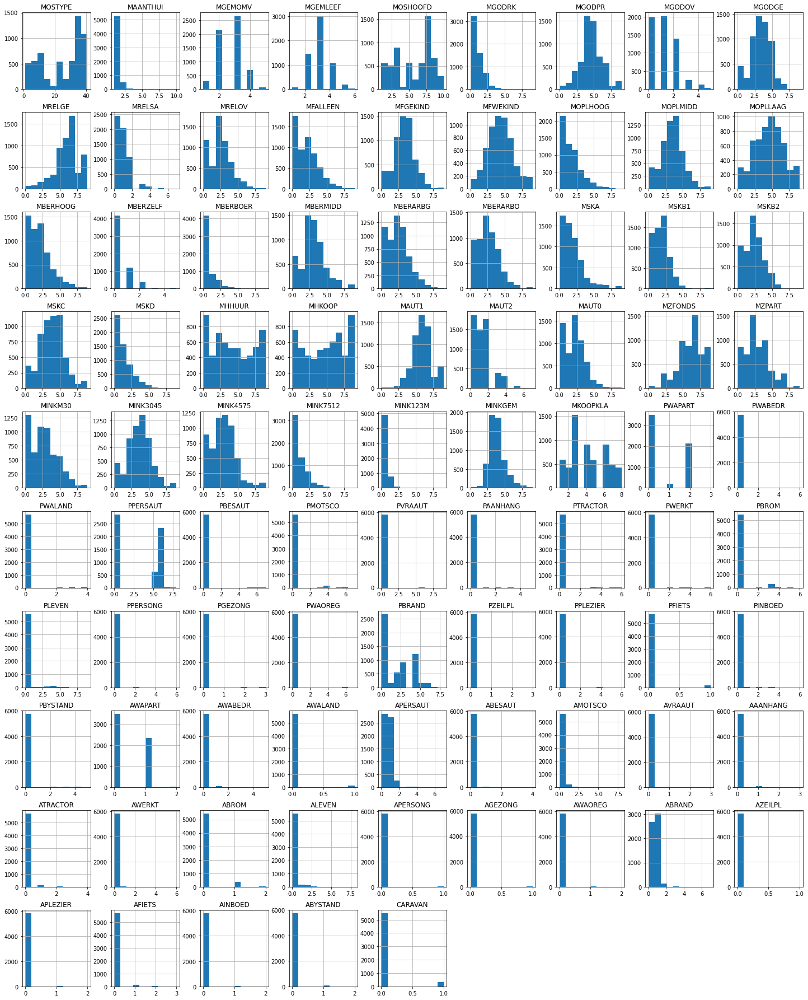

In [ ]:
#histograms (the distribution) for each variable
df[df.describe().columns].hist(figsize=(25,32));

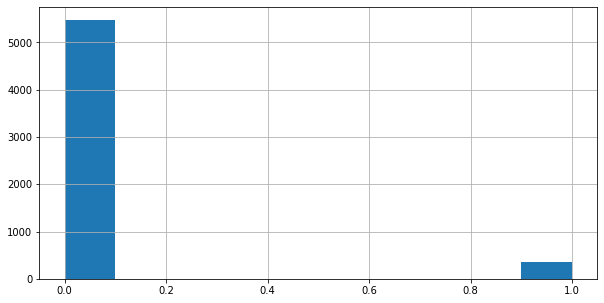

In [ ]:
#visualization of the target variable
df['CARAVAN'].hist(figsize=(10,5))

In [ ]:
#target variable CARAVAN

#the value counts
print(df.CARAVAN.value_counts())

#the percentage of value counts
print(df.CARAVAN.value_counts()/len(df))

0    5474
1     348
Name: CARAVAN, dtype: int64
0    0.940227
1    0.059773
Name: CARAVAN, dtype: float64


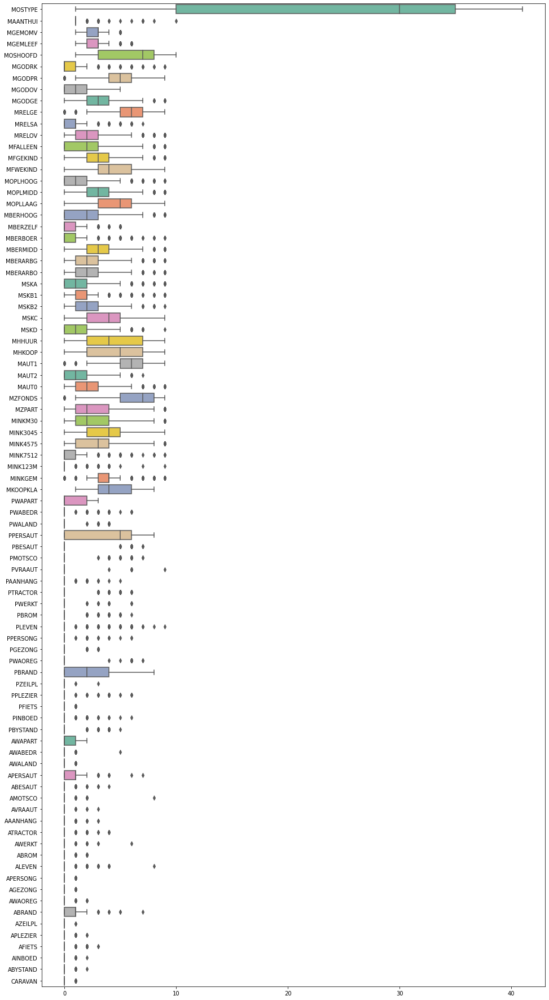

In [ ]:
#boxplot of variables
from matplotlib import rcParams

rcParams['figure.figsize'] = 16,32
ax = sns.boxplot(data=df, orient="h", palette="Set2")

# Feature Selection

## Correlation of variables
We will use the correlation matrix to drop some variables. If two variables are highly correlated, then we will drop one of the variables because their contribution in the models would be useless. We will use the threshold absolute value 0.85 as an indication of high correlation. When plotting the correlation matrix, since we have a high number of variables, we will show them in groups of 15 variables.

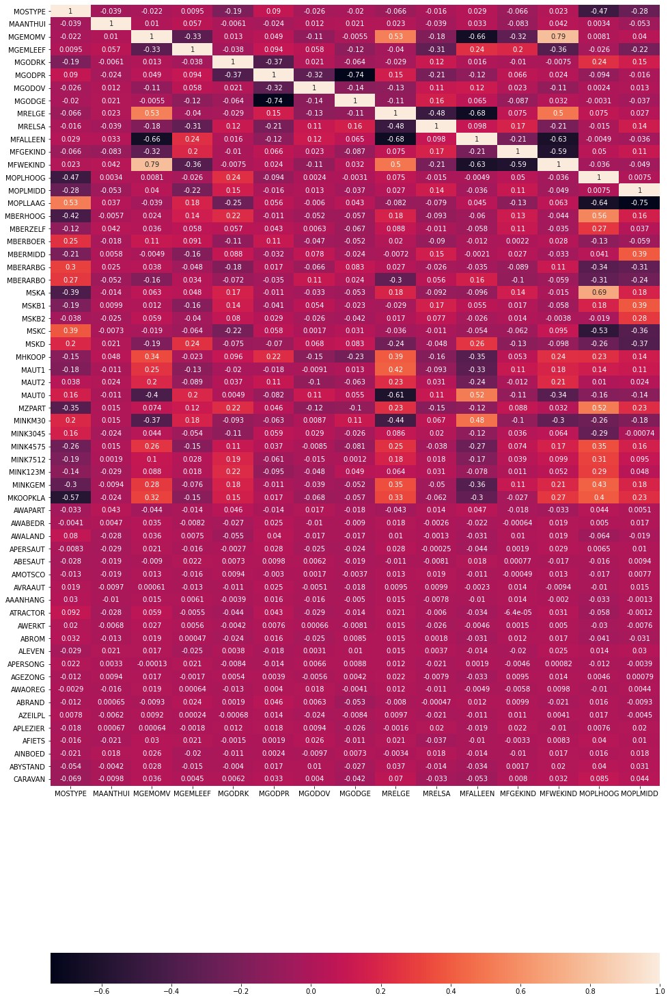

In [ ]:
from matplotlib import rcParams

rcParams['figure.figsize'] = 16,30

corr_matrix = df.corr()[:15].T
sns.heatmap(corr_matrix, annot = True,  cbar_kws= {'orientation': 'horizontal'} )

+ MOSTYPE is highly positively correlated with MOSHOOFD, so we need to drop one of these variables. We will choose to drop MOSHOOFD because MOSTYPE is more specific in the details of description. 
+ MRELGE is highly negatively correlated to the MRELOV. In this case, even though we have negative correlation, we will need to drop one of the variables. We will drop MRELOV and keep MRELGE since it indicates the marriage status. 

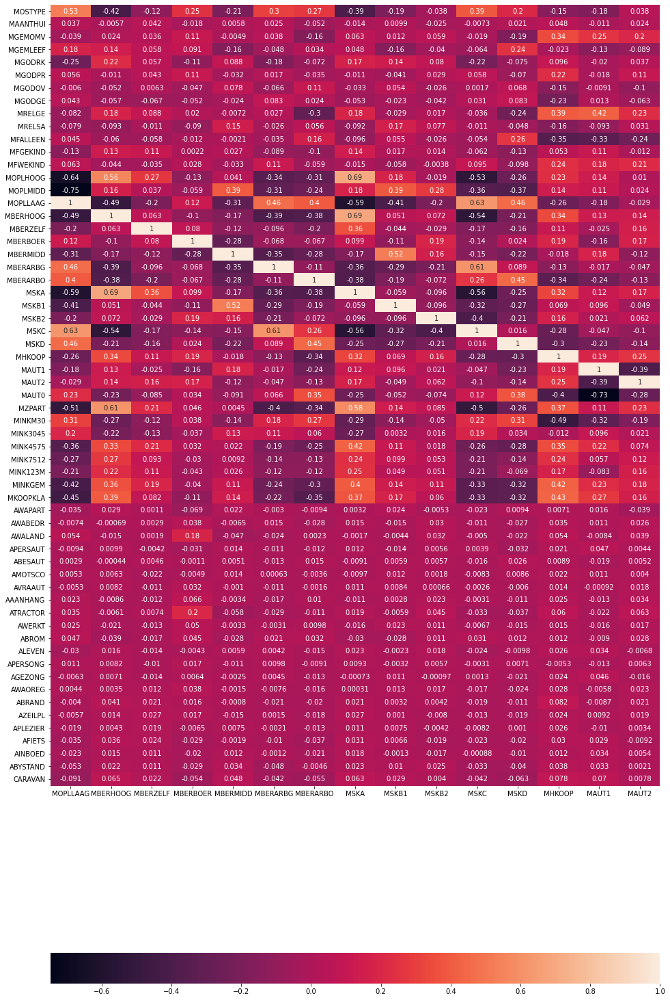

In [ ]:
corr_matrix = df.corr()[15:30].T
sns.heatmap(corr_matrix, annot = True,  cbar_kws= {'orientation': 'horizontal'} )

+ MHHUUR and MHKOOP are highly negatively correlated. We will keep MHKOOP (home-owners) and drop MHHUUR.

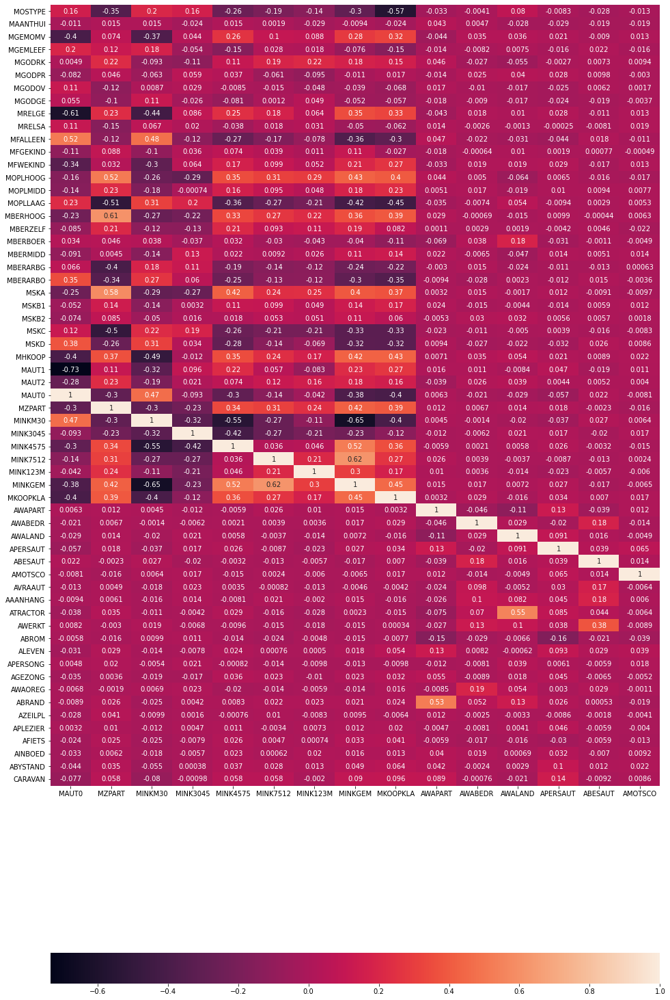

In [ ]:
corr_matrix = df.corr()[30:45].T
sns.heatmap(corr_matrix, annot = True,  cbar_kws= {'orientation': 'horizontal'} )

+ MZFONDS and MZPART are highly negatively correlated. We will MZPART and drop MZFONDS.
+ PWAPART and AWAPART are highly positively correlated. We will drop PWAPART and keep AWAPART.
+ PWABEDR and AWABEDR are highly positively correlated. We will drop PWABEDR and keep AWABEDR.

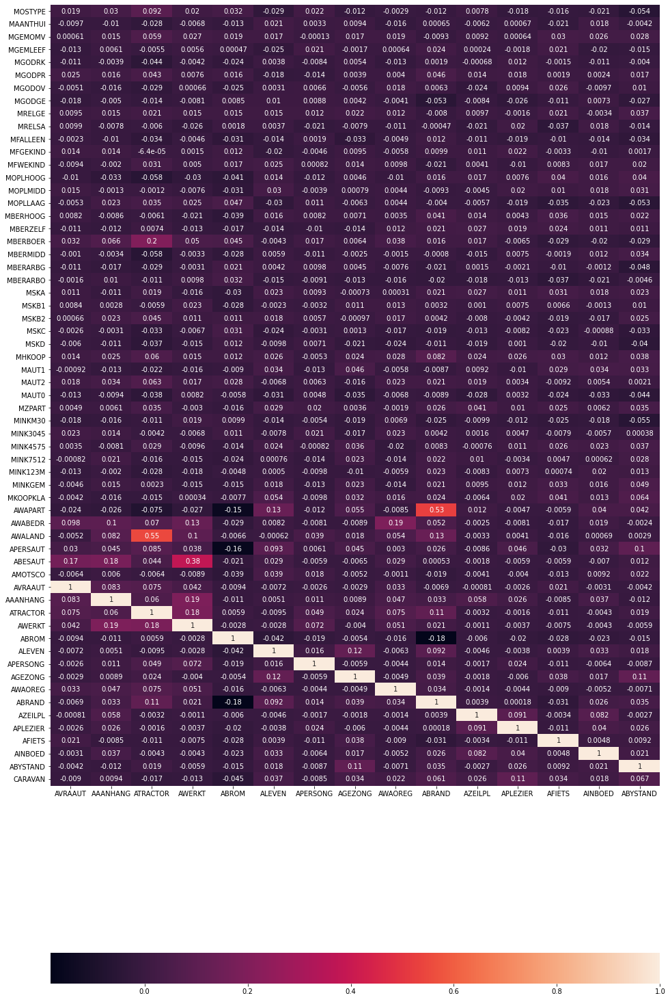

In [ ]:
corr_matrix = df.corr()[45:60].T
sns.heatmap(corr_matrix, annot = True,  cbar_kws= {'orientation': 'horizontal'} )

+ PWALAND and AWALAND are highly positively correlated.
+ PPERSAUT and APERSAUT are highly positively correlated.
+ PBESAUT and ABESAUT are highly positively correlated.
+ PMOTSCO and AMOTSCO are highly positively correlated.
+ PVRAAUT and AVRAUT are highly positively correlated.
+ PAANHANG and AAANHANG are highly positively correlated.
+ PTRACTOR and ATRACTOR are highly positively correlated.
+ PWERKT and AWERKT are highly positively correlated.
+ PBROM  and ABROM are highly positively correlated.
+ PLEVEN and ALEVEN are highly positively correlated.
+ PPERSONG and APERSONG are highly positively correlated.
+ PGEZONG and AGEZONG are highly positively correlated.
+ PWAOREG and AWAOREG are highly positively correlated.
+ PBRAND and ABRAND are highly positively correlated.
+ PZEILPL and AZEILPL are highly positively correlated.

We will drop 'PWALAND', 'PPERSAUT', 'PBESAUT', 'PMOTSCO', 'PVRAAUT', 'PAANHANG', 'PTRACTOR', 'PWERKT', 'PBROM', 'PLEVEN', 'PPERSONG', 'PGEZONG', 'PWAOREG', 'PBRAND', 'PZEILPL'. 

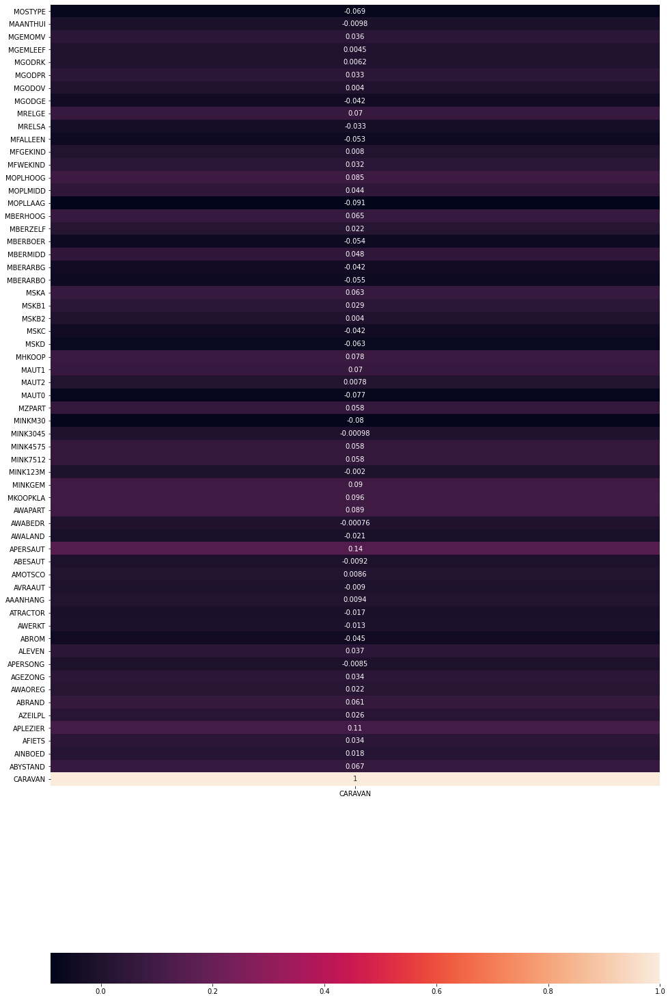

In [ ]:
corr_matrix = df.corr()[60:75].T
sns.heatmap(corr_matrix, annot = True,  cbar_kws= {'orientation': 'horizontal'} )

+ PPLEZIER and APLEZIER are highly positively correlated.
+ PFIETS and AFIETS are highly positively correlated.
+ PINBOED and AINBOED are highly positively correlated.
+ PBYSTAND and ABYSTAND are highly positively correlated.

We will drop PPLEZIER, PFIETS, PINBOED, and PBYSTAND.



In [ ]:
corr_matrix = df.corr()[75:].T
sns.heatmap(corr_matrix, annot = True,  cbar_kws= {'orientation': 'horizontal'} )

ValueError: ignored

In [ ]:
#dropping the abovementioned variables
df = df.drop(['MOSHOOFD', 'MRELOV', 'MHHUUR', 'MZFONDS',  'PWAPART', 'PWABEDR', 'PWALAND', 'PPERSAUT', 'PBESAUT', 'PMOTSCO', 'PVRAAUT', 'PAANHANG',
       'PTRACTOR', 'PWERKT', 'PBROM', 'PLEVEN', 'PPERSONG', 'PGEZONG',
       'PWAOREG', 'PBRAND', 'PZEILPL', 'PPLEZIER', 'PFIETS', 'PINBOED', 'PBYSTAND'], axis = 1)

KeyError: ignored

In [ ]:
#20 most correlated variables to CARAVAN after dropping the highly correlated variables
df.corr().CARAVAN.sort_values(ascending = False)[1:21]

APERSAUT    0.144210
APLEZIER    0.105700
MKOOPKLA    0.095938
MINKGEM     0.090185
AWAPART     0.089387
MOPLHOOG    0.084635
MHKOOP      0.078429
MRELGE      0.070264
MAUT1       0.069974
ABYSTAND    0.066658
MBERHOOG    0.065082
MSKA        0.063498
ABRAND      0.061381
MINK7512    0.057921
MINK4575    0.057692
MZPART      0.057518
MBERMIDD    0.047716
MOPLMIDD    0.043517
ALEVEN      0.037118
MGEMOMV     0.035573
Name: CARAVAN, dtype: float64

## Statistical Significance
Here we will check which variables are highly statistically significant to CARAVAN. We will use Backward elimination method to remove the variables that are not significant to CARAVAN.

In [ ]:
import statsmodels.api as sm

df_new = sm.add_constant(df.drop(['CARAVAN'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.052
Method:                 Least Squares   F-statistic:                     6.350
Date:                Sat, 08 May 2021   Prob (F-statistic):           2.43e-46
Time:                        17:48:37   Log-Likelihood:                 305.64
No. Observations:                5822   AIC:                            -489.3
Df Residuals:                    5761   BIC:                            -82.45
Df Model:                          60                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1268      0.118     -1.073      0.2

+ MGODPR has the highest p-value, so we will drop that first.

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.052
Method:                 Least Squares   F-statistic:                     6.459
Date:                Sat, 08 May 2021   Prob (F-statistic):           9.51e-47
Time:                        17:48:42   Log-Likelihood:                 305.64
No. Observations:                5822   AIC:                            -491.3
Df Residuals:                    5762   BIC:                            -91.12
Df Model:                          59                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1252      0.111     -1.129      0.2

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.053
Method:                 Least Squares   F-statistic:                     6.571
Date:                Sat, 08 May 2021   Prob (F-statistic):           3.68e-47
Time:                        17:48:45   Log-Likelihood:                 305.64
No. Observations:                5822   AIC:                            -493.3
Df Residuals:                    5763   BIC:                            -99.78
Df Model:                          58                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1254      0.111     -1.132      0.2

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.053
Method:                 Least Squares   F-statistic:                     6.688
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.42e-47
Time:                        17:48:49   Log-Likelihood:                 305.64
No. Observations:                5822   AIC:                            -495.3
Df Residuals:                    5764   BIC:                            -108.4
Df Model:                          57                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1255      0.111     -1.133      0.2

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.053
Method:                 Least Squares   F-statistic:                     6.808
Date:                Sat, 08 May 2021   Prob (F-statistic):           5.42e-48
Time:                        17:48:52   Log-Likelihood:                 305.63
No. Observations:                5822   AIC:                            -497.3
Df Residuals:                    5765   BIC:                            -117.1
Df Model:                          56                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1252      0.111     -1.131      0.2

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.053
Method:                 Least Squares   F-statistic:                     6.933
Date:                Sat, 08 May 2021   Prob (F-statistic):           2.06e-48
Time:                        17:48:56   Log-Likelihood:                 305.62
No. Observations:                5822   AIC:                            -499.2
Df Residuals:                    5766   BIC:                            -125.8
Df Model:                          55                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1250      0.111     -1.128      0.2

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.053
Method:                 Least Squares   F-statistic:                     7.062
Date:                Sat, 08 May 2021   Prob (F-statistic):           7.75e-49
Time:                        17:48:58   Log-Likelihood:                 305.61
No. Observations:                5822   AIC:                            -501.2
Df Residuals:                    5767   BIC:                            -134.4
Df Model:                          54                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1315      0.101     -1.300      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 'MSKD'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.053
Method:                 Least Squares   F-statistic:                     7.196
Date:                Sat, 08 May 2021   Prob (F-statistic):           2.91e-49
Time:                        17:49:02   Log-Likelihood:                 305.59
No. Observations:                5822   AIC:                            -503.2
Df Residuals:                    5768   BIC:                            -143.0
Df Model:                          53                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1318      0.101     -1.304      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     7.335
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.08e-49
Time:                        17:49:05   Log-Likelihood:                 305.57
No. Observations:                5822   AIC:                            -505.1
Df Residuals:                    5769   BIC:                            -151.7
Df Model:                          52                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1333      0.101     -1.322      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     7.479
Date:                Sat, 08 May 2021   Prob (F-statistic):           3.96e-50
Time:                        17:49:09   Log-Likelihood:                 305.57
No. Observations:                5822   AIC:                            -507.1
Df Residuals:                    5770   BIC:                            -160.3
Df Model:                          51                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1341      0.101     -1.334      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     7.629
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.46e-50
Time:                        17:49:12   Log-Likelihood:                 305.54
No. Observations:                5822   AIC:                            -509.1
Df Residuals:                    5771   BIC:                            -168.9
Df Model:                          50                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1345      0.101     -1.337      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     7.785
Date:                Sat, 08 May 2021   Prob (F-statistic):           5.34e-51
Time:                        17:49:15   Log-Likelihood:                 305.50
No. Observations:                5822   AIC:                            -511.0
Df Residuals:                    5772   BIC:                            -177.5
Df Model:                          49                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1354      0.100     -1.348      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     7.946
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.97e-51
Time:                        17:49:18   Log-Likelihood:                 305.45
No. Observations:                5822   AIC:                            -512.9
Df Residuals:                    5773   BIC:                            -186.1
Df Model:                          48                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1427      0.098     -1.456      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     8.115
Date:                Sat, 08 May 2021   Prob (F-statistic):           7.08e-52
Time:                        17:49:21   Log-Likelihood:                 305.41
No. Observations:                5822   AIC:                            -514.8
Df Residuals:                    5774   BIC:                            -194.7
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1467      0.097     -1.515      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     8.290
Date:                Sat, 08 May 2021   Prob (F-statistic):           2.55e-52
Time:                        17:49:24   Log-Likelihood:                 305.36
No. Observations:                5822   AIC:                            -516.7
Df Residuals:                    5775   BIC:                            -203.3
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1310      0.083     -1.577      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     8.473
Date:                Sat, 08 May 2021   Prob (F-statistic):           9.21e-53
Time:                        17:49:28   Log-Likelihood:                 305.29
No. Observations:                5822   AIC:                            -518.6
Df Residuals:                    5776   BIC:                            -211.8
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1310      0.083     -1.577      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     8.663
Date:                Sat, 08 May 2021   Prob (F-statistic):           3.32e-53
Time:                        17:49:31   Log-Likelihood:                 305.22
No. Observations:                5822   AIC:                            -520.4
Df Residuals:                    5777   BIC:                            -220.3
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1328      0.083     -1.601      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     8.860
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.22e-53
Time:                        17:49:34   Log-Likelihood:                 305.10
No. Observations:                5822   AIC:                            -522.2
Df Residuals:                    5778   BIC:                            -228.8
Df Model:                          43                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1271      0.082     -1.548      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     9.065
Date:                Sat, 08 May 2021   Prob (F-statistic):           4.63e-54
Time:                        17:49:37   Log-Likelihood:                 304.95
No. Observations:                5822   AIC:                            -523.9
Df Residuals:                    5779   BIC:                            -237.1
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1265      0.082     -1.541      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     9.280
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.71e-54
Time:                        17:49:41   Log-Likelihood:                 304.80
No. Observations:                5822   AIC:                            -525.6
Df Residuals:                    5780   BIC:                            -245.5
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1277      0.082     -1.557      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     9.505
Date:                Sat, 08 May 2021   Prob (F-statistic):           6.39e-55
Time:                        17:49:45   Log-Likelihood:                 304.63
No. Observations:                5822   AIC:                            -527.3
Df Residuals:                    5781   BIC:                            -253.8
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1282      0.082     -1.563      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     9.740
Date:                Sat, 08 May 2021   Prob (F-statistic):           2.41e-55
Time:                        17:49:48   Log-Likelihood:                 304.44
No. Observations:                5822   AIC:                            -528.9
Df Residuals:                    5782   BIC:                            -262.1
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1287      0.082     -1.569      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     9.987
Date:                Sat, 08 May 2021   Prob (F-statistic):           8.97e-56
Time:                        17:49:51   Log-Likelihood:                 304.25
No. Observations:                5822   AIC:                            -530.5
Df Residuals:                    5783   BIC:                            -270.4
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1289      0.082     -1.571      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     10.24
Date:                Sat, 08 May 2021   Prob (F-statistic):           3.66e-56
Time:                        17:49:54   Log-Likelihood:                 303.94
No. Observations:                5822   AIC:                            -531.9
Df Residuals:                    5784   BIC:                            -278.4
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1090      0.078     -1.398      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     10.51
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.38e-56
Time:                        17:49:58   Log-Likelihood:                 303.71
No. Observations:                5822   AIC:                            -533.4
Df Residuals:                    5785   BIC:                            -286.7
Df Model:                          36                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1192      0.076     -1.559      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     10.80
Date:                Sat, 08 May 2021   Prob (F-statistic):           5.43e-57
Time:                        17:50:02   Log-Likelihood:                 303.41
No. Observations:                5822   AIC:                            -534.8
Df Residuals:                    5786   BIC:                            -294.7
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1028      0.073     -1.400      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     11.11
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.80e-57
Time:                        17:50:05   Log-Likelihood:                 303.29
No. Observations:                5822   AIC:                            -536.6
Df Residuals:                    5787   BIC:                            -303.2
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1028      0.073     -1.399      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     11.43
Date:                Sat, 08 May 2021   Prob (F-statistic):           7.16e-58
Time:                        17:50:09   Log-Likelihood:                 302.95
No. Observations:                5822   AIC:                            -537.9
Df Residuals:                    5788   BIC:                            -311.2
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1019      0.073     -1.388      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     11.76
Date:                Sat, 08 May 2021   Prob (F-statistic):           2.87e-58
Time:                        17:50:12   Log-Likelihood:                 302.60
No. Observations:                5822   AIC:                            -539.2
Df Residuals:                    5789   BIC:                            -319.1
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1110      0.073     -1.527      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     12.12
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.12e-58
Time:                        17:50:16   Log-Likelihood:                 302.24
No. Observations:                5822   AIC:                            -540.5
Df Residuals:                    5790   BIC:                            -327.1
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1113      0.073     -1.533      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     12.50
Date:                Sat, 08 May 2021   Prob (F-statistic):           4.56e-59
Time:                        17:50:19   Log-Likelihood:                 301.84
No. Observations:                5822   AIC:                            -541.7
Df Residuals:                    5791   BIC:                            -334.9
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1035      0.072     -1.435      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     12.90
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.92e-59
Time:                        17:50:22   Log-Likelihood:                 301.38
No. Observations:                5822   AIC:                            -542.8
Df Residuals:                    5792   BIC:                            -342.7
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1038      0.072     -1.439      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     13.32
Date:                Sat, 08 May 2021   Prob (F-statistic):           8.04e-60
Time:                        17:50:27   Log-Likelihood:                 300.90
No. Observations:                5822   AIC:                            -543.8
Df Residuals:                    5793   BIC:                            -350.4
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0967      0.072     -1.348      0.1

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO', 'MAUT0'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.060
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     13.76
Date:                Sat, 08 May 2021   Prob (F-statistic):           4.16e-60
Time:                        17:50:30   Log-Likelihood:                 300.19
No. Observations:                5822   AIC:                            -544.4
Df Residuals:                    5794   BIC:                            -357.6
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0212      0.034     -0.621      0.5

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO', 'MAUT0',
                                 'MAUT2'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.060
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     14.26
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.67e-60
Time:                        17:50:33   Log-Likelihood:                 299.72
No. Observations:                5822   AIC:                            -545.4
Df Residuals:                    5795   BIC:                            -365.4
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0150      0.033     -0.448      0.6

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO', 'MAUT0',
                                 'MAUT2', 'MAUT1'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.060
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     14.80
Date:                Sat, 08 May 2021   Prob (F-statistic):           5.90e-61
Time:                        17:50:36   Log-Likelihood:                 299.38
No. Observations:                5822   AIC:                            -546.8
Df Residuals:                    5796   BIC:                            -373.4
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0071      0.032     -0.220      0.8

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO', 'MAUT0',
                                 'MAUT2', 'MAUT1', 'MGODGE'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.060
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     15.36
Date:                Sat, 08 May 2021   Prob (F-statistic):           2.83e-61
Time:                        17:50:39   Log-Likelihood:                 298.69
No. Observations:                5822   AIC:                            -547.4
Df Residuals:                    5797   BIC:                            -380.6
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0191      0.030     -0.629      0.5

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO', 'MAUT0',
                                 'MAUT2', 'MAUT1', 'MGODGE', 'MZPART'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.060
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     15.97
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.31e-61
Time:                        17:50:42   Log-Likelihood:                 298.02
No. Observations:                5822   AIC:                            -548.0
Df Residuals:                    5798   BIC:                            -388.0
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0261      0.030     -0.878      0.3

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO', 'MAUT0',
                                 'MAUT2', 'MAUT1', 'MGODGE', 'MZPART', 'MFGEKIND'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.059
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     16.63
Date:                Sat, 08 May 2021   Prob (F-statistic):           6.14e-62
Time:                        17:50:45   Log-Likelihood:                 297.32
No. Observations:                5822   AIC:                            -548.6
Df Residuals:                    5799   BIC:                            -395.2
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0300      0.030     -1.012      0.3

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO', 'MAUT0',
                                 'MAUT2', 'MAUT1', 'MGODGE', 'MZPART', 'MFGEKIND', 'AGEZONG'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.059
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     17.35
Date:                Sat, 08 May 2021   Prob (F-statistic):           3.06e-62
Time:                        17:50:48   Log-Likelihood:                 296.52
No. Observations:                5822   AIC:                            -549.0
Df Residuals:                    5800   BIC:                            -402.3
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0306      0.030     -1.035      0.3

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO', 'MAUT0',
                                 'MAUT2', 'MAUT1', 'MGODGE', 'MZPART', 'MFGEKIND', 'AGEZONG', 'AZEILPL'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.059
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     18.12
Date:                Sat, 08 May 2021   Prob (F-statistic):           1.63e-62
Time:                        17:50:51   Log-Likelihood:                 295.64
No. Observations:                5822   AIC:                            -549.3
Df Residuals:                    5801   BIC:                            -409.2
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0301      0.030     -1.016      0.3

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO', 'MAUT0',
                                 'MAUT2', 'MAUT1', 'MGODGE', 'MZPART', 'MFGEKIND', 'AGEZONG', 'AZEILPL',
                                 'MGODRK'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     18.97
Date:                Sat, 08 May 2021   Prob (F-statistic):           9.41e-63
Time:                        17:50:54   Log-Likelihood:                 294.65
No. Observations:                5822   AIC:                            -549.3
Df Residuals:                    5802   BIC:                            -415.9
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0353      0.029     -1.204      0.2

In [ ]:
df_new = sm.add_constant(df.drop(['CARAVAN', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO', 'MAUT0',
                                 'MAUT2', 'MAUT1', 'MGODGE', 'MZPART', 'MFGEKIND', 'AGEZONG', 'AZEILPL',
                                 'MGODRK', 'MKOOPKLA'], axis=1))
ols = sm.OLS(df['CARAVAN'],df_new)
results = ols.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                CARAVAN   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     19.88
Date:                Sat, 08 May 2021   Prob (F-statistic):           6.78e-63
Time:                        17:50:58   Log-Likelihood:                 293.40
No. Observations:                5822   AIC:                            -548.8
Df Residuals:                    5803   BIC:                            -422.1
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0218      0.028     -0.776      0.4

+ The p-values of these remaining variables are acceptable to state that these variables are highly significant to the variable CARAVAN.

In [ ]:
df = df.drop(['MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 
                                  'MSKD', 'MSKB2', 'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN',
                                 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 'ATRACTOR', 'AAANHANG',
                                 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                                 'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO', 'MAUT0',
                                 'MAUT2', 'MAUT1', 'MGODGE', 'MZPART', 'MFGEKIND', 'AGEZONG', 'AZEILPL',
                                 'MGODRK', 'MKOOPKLA'], axis=1)

# Removing Outliers

In [ ]:
#the number of entries of the dataset
len(df)

5822

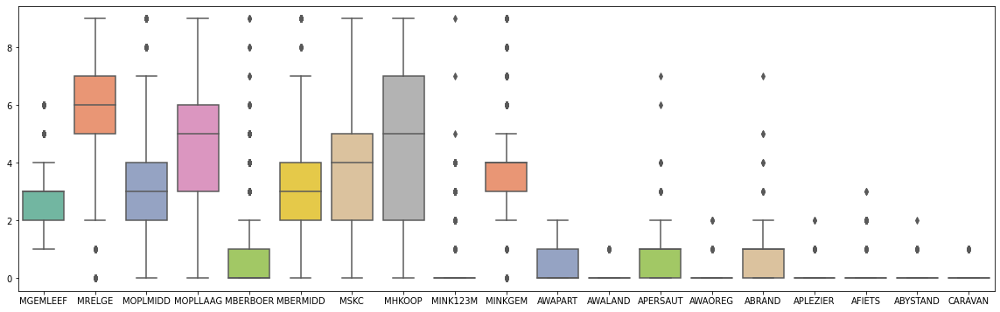

In [ ]:
#boxplot of variables 
from matplotlib import rcParams

rcParams['figure.figsize'] = 20,6
ax = sns.boxplot(data=df, palette="Set2")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match D

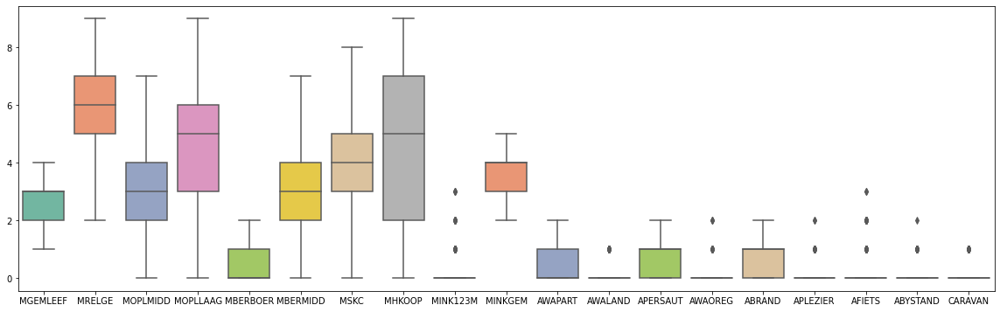

In [ ]:
#boxplot of variables after removing the outliers in the variables
from matplotlib import rcParams

rcParams['figure.figsize'] = 20,6
ax = sns.boxplot(data=df[df.MGEMLEEF <= 4][df.MRELGE >=2][df.MOPLMIDD <= 7][df.MBERBOER <=2][df.MBERMIDD <= 7][df.MSKC <= 8 ][df.MINKGEM >= 2][df.MINKGEM <=5][df.APERSAUT <=2][df.ABRAND <=2], palette="Set2")

In [ ]:
#the number of entries after removing the outliers
len(df[df.MGEMLEEF <= 4][df.MRELGE >=2][df.MOPLMIDD <= 7][df.MBERBOER <=2][df.MBERMIDD <= 7][df.MSKC <= 8 ][df.MINKGEM >= 2][df.MINKGEM <=5][df.APERSAUT <=2][df.ABRAND <=2])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  

4352

In [ ]:
df = df[df.MGEMLEEF <= 4][df.MRELGE >=2][df.MOPLMIDD <= 7][df.MBERBOER <=2][df.MBERMIDD <= 7][df.MSKC <= 8 ][df.MINKGEM >= 2][df.MINKGEM <=5][df.APERSAUT <=2][df.ABRAND <=2].reset_index(drop=True)

NameError: ignored

In [ ]:
df

,MGEMLEEF,MRELGE,MOPLMIDD,MOPLLAAG,MBERBOER,MBERMIDD,MSKC,MHKOOP,MINK123M,MINKGEM,AWAPART,AWALAND,APERSAUT,AWAOREG,ABRAND,APLEZIER,AFIETS,ABYSTAND,CARAVAN
0,2,7,2,7,1,2,6,8,0,4,0,0,1,0,1,0,0,0,0
1,2,6,5,4,0,5,5,7,0,5,2,0,0,0,1,0,0,0,0
2,2,3,5,4,0,7,4,2,0,3,1,0,1,0,1,0,0,0,0
3,3,5,4,2,0,3,4,4,0,4,0,0,1,0,1,0,0,0,0
4,2,7,4,5,0,4,5,3,0,3,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4347,3,6,7,2,0,5,5,9,0,5,0,0,1,0,0,0,0,0,0
4348,4,6,0,9,1,3,0,6,0,4,0,0,0,0,1,0,0,0,0
4349,4,5,1,8,0,2,4,2,0,3,1,0,1,0,1,0,0,0,1
4350,2,7,2,7,0,2,5,7,0,4,0,0,1,0,0,0,0,0,0


## Data Augmentation

In [ ]:
df.CARAVAN.value_counts()

NameError: ignored

In [ ]:
# Data Augmentation
from imblearn.over_sampling import SMOTE

oversample = SMOTE(random_state=123, sampling_strategy=0.8)
X_resampled, y_resampled = oversample.fit_resample(df.drop(['CARAVAN'],axis=1), df['CARAVAN'])

#augmented dataset
df_resampled = pd.concat([X_resampled, y_resampled], axis=1)
df_resampled

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


TypeError: ignored

In [ ]:
#target variable after data augmentation
y_resampled.value_counts()

AttributeError: ignored

# Data Preprocessing

In [ ]:
#features and target for non-augmented dataset
X = df.drop(['CARAVAN'], axis=1)
y = df['CARAVAN']

## Train-test split

In [ ]:
#train-test split for non-augmented dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 10)

#train-test split for augmented dataset
X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled = train_test_split(X_resampled, y_resampled, test_size = 0.2, random_state = 10)

## Standardization

In [ ]:
from sklearn.preprocessing import StandardScaler

#for the non-augmented dataset
scale= StandardScaler()
X_train_scaled = scale.fit_transform(X_train)
X_test_scaled = scale.fit_transform(X_test)

#for the augmented dataset
X_train_resampled_scaled = scale.fit_transform(X_train_resampled)
X_test_resampled_scaled = scale.fit_transform(X_test_resampled)

# Prediction Models

In [ ]:
#prediction models modules
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier


from sklearn.metrics import accuracy_score, f1_score, classification_report

def prediction_models(data=[], verbose=False):    
    #List of models to be used
    models=[LogisticRegression(),KNeighborsClassifier(n_neighbors=5),
            RandomForestClassifier(n_estimators=19),GradientBoostingClassifier(), 
            SVC(), DecisionTreeClassifier(),]
    #Create training and testing data sets depending on wheather or not they have been generated previously.
    if len(data)== 2:
        X_train, X_test, y_train, y_test = train_test_split(data[0],data[1],random_state=123)
    else:
        X_train, X_test, y_train, y_test = data[0],data[1],data[2],data[3]
        
    #Instantiate lists to store each of the models results
    accuracy = []
    f1 = []

    #Run thorugh each of the models to get their performance metrics
    for model in models:
        clf = model
        clf.fit(X_train, y_train)
        test_preds = clf.predict(X_test)
        accuracy.append(accuracy_score(y_test, test_preds))
        f1.append(f1_score(y_test, test_preds))
        
        #Print the model and its report
        if verbose:
            print('Prediction Model: ',model,'\n')
            print(classification_report(y_test, test_preds),'\n')
    #store results in dataframe
    results = pd.DataFrame([accuracy, f1],
                      index= ['accuracy', 'f1_score'],
                           columns=['LogisticRegression','KNN','RandomForest','Gradient Boosting', 'SVC', 'DecisionTree'])
    #Change orientation of the dataframe
    return results.transpose()

def plot_feat_importance(clf,index):
    '''Plot the 10 most important variables for a prediction model in a bar chart
    according to importance'''
    feat_importances = pd.DataFrame(clf.feature_importances_, index=index, columns=['Score'])
    feat_importances = feat_importances.sort_values(by='Score',ascending=True).tail(10)
    feat_importances.plot(kind='barh', title='Top 10 Important Variables',legend=False)
    plt.xlabel('Importance Score')
    plt.ylabel('Variable')
    plt.show();

# Applying models to non-augmented dataset

In [ ]:
#Display the results of the models as a dataframe
#Sort models according to f1 score.
prediction_models(data=[X_train_scaled, X_test_scaled, y_train, y_test], verbose=True).sort_values('f1_score', ascending = False)

Prediction Model:  LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False) 

              precision    recall  f1-score   support

           0       0.95      1.00      0.97       824
           1       0.00      0.00      0.00        47

    accuracy                           0.94       871
   macro avg       0.47      0.50      0.49       871
weighted avg       0.89      0.94      0.92       871
 

Prediction Model:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform') 

              precision    recall  f1-score   support

           0       0.95      0.98      0.96       824
       

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,accuracy,f1_score
DecisionTree,0.881745,0.104348
RandomForest,0.917336,0.076923
LogisticRegression,0.942595,0.000000
KNN,0.928817,0.000000
Gradient Boosting,0.940299,0.000000
SVC,0.946039,0.000000


The best model with the cleaned non-augmented dataset is Decision Tree. Even though it shows the lowest accuracy, this model is able to predict some cases when CARAVAN = 1, which is in fact what we are interested in. Below, we will see what are 10 most important variables for this model.

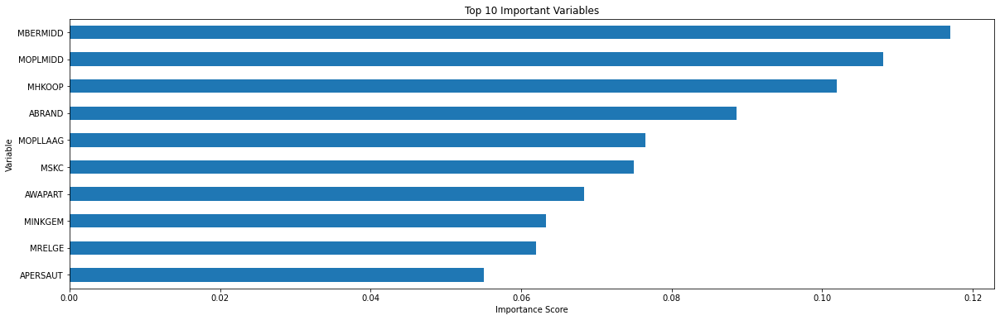

In [ ]:
#10 most important variables 
clf = DecisionTreeClassifier()
clf.fit(X_train_scaled,y_train)
plot_feat_importance(clf, df.drop(['CARAVAN'],axis=1).columns)

# Applying models to augmented dataset

In [ ]:
#Display the results of the models as a dataframe
#Sort models according to f1 score.
prediction_models(data=[X_train_resampled_scaled, X_test_resampled_scaled, y_train_resampled, y_test_resampled], verbose=True).sort_values('f1_score', ascending = False)

Prediction Model:  LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False) 

              precision    recall  f1-score   support

           0       0.68      0.80      0.74       830
           1       0.67      0.52      0.59       645

    accuracy                           0.68      1475
   macro avg       0.68      0.66      0.66      1475
weighted avg       0.68      0.68      0.67      1475
 

Prediction Model:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform') 

              precision    recall  f1-score   support

           0       0.91      0.79      0.85       830
       

,accuracy,f1_score
RandomForest,0.932203,0.923547
DecisionTree,0.903051,0.891255
KNN,0.837966,0.829408
SVC,0.823051,0.804494
Gradient Boosting,0.798644,0.769231
LogisticRegression,0.677966,0.585876


The best model after data augmentation is Random Forest with the highest accuracy and highest f1_score. This model performs nicely but we have to remind ourselves that in this case we are dealing with a pretty balanced dataset.

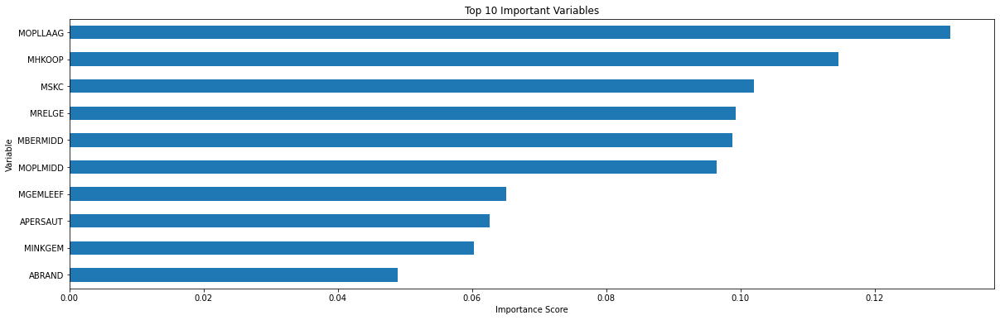

In [ ]:
#10 most important variables 
clf = RandomForestClassifier()
clf.fit(X_train_resampled_scaled,y_train_resampled)
plot_feat_importance(clf, df.drop(['CARAVAN'],axis=1).columns)

# Applying the best models to the test dataset

In [ ]:
#reading the data
test = pd.read_csv('/content/drive/MyDrive/Data/test_data.csv')

NameError: ignored

In [ ]:
#dropping the variables we dropped in the train dataset
test = test.drop(['MOSHOOFD', 'MRELOV', 'MHHUUR', 'MZFONDS',  'PWAPART', 'PWABEDR', 'PWALAND', 'PPERSAUT', 'PBESAUT', 'PMOTSCO', 'PVRAAUT', 'PAANHANG',
       'PTRACTOR', 'PWERKT', 'PBROM', 'PLEVEN', 'PPERSONG', 'PGEZONG', 'PWAOREG', 'PBRAND', 'PZEILPL', 'PPLEZIER', 'PFIETS', 
                  'PINBOED', 'PBYSTAND', 'MGODPR', 'AWABEDR', 'AINBOED', 'AMOTSCO', 'MBERARBG', 'MFWEKIND', 'MSKD', 'MSKB2', 
                  'MSKA', 'MBERZELF', 'MGODOV', 'MGEMOMV', 'MFALLEEN', 'MOPLHOOG', 'ABROM', 'MRELSA', 'MOSTYPE', 'AWERKT', 
                  'ATRACTOR', 'AAANHANG', 'MSKB1', 'APERSONG', 'MINK4575', 'MINK7512', 'MINKM30', 'MINK3045', 
                   'ABESAUT', 'MAANTHUI', 'ALEVEN', 'MBERHOOG', 'AVRAAUT', 'MBERARBO', 'MAUT0',
                   'MAUT2', 'MAUT1', 'MGODGE', 'MZPART', 'MFGEKIND', 'AGEZONG', 'AZEILPL','MGODRK', 'MKOOPKLA'], axis=1)

In [ ]:
#standardizing the data
test_scaled = scale.fit_transform(test)

## Applying the Decision Tree model with non-augmented data

In [ ]:
#predicting for the test dataset
clf = DecisionTreeClassifier()
clf.fit(X_train_scaled,y_train)
predictions_dt = clf.predict(test_scaled)

## Applying the Random Forest model with augmented data

In [ ]:
clf = RandomForestClassifier()
clf.fit(X_train_resampled_scaled,y_train_resampled)
predictions_rf = clf.predict(test_scaled)

=========================================================================================================================




# Classification
**Second challenge** is to derive information about the profile of a typical caravan
insurance buyer to give a clear insight to why customers have a caravan policy and
how these customers are different from other customers.

Here, we just need to plot the trees of the Decision Tree model applied in the section above. 

We will see on the lower leaves when the class = 1 and follow back to the root. That is how the profile of a typical caravan policy buyer is created.

For better inspection, check the saved plots as png.

In [ ]:
from sklearn import tree

## Plotting the Decision Tree model with non-augmented dataset

In [ ]:
#model with non-augmented data
clf = DecisionTreeClassifier()
clf.fit(X_train_scaled,y_train)
clf.predict(X_test_scaled)

#plotting full tree
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (300,55))
tree.plot_tree(clf,  feature_names = X.columns, class_names = ['0', '1']);

In [ ]:
fig.savefig('DecisionTree_nonaug.png')

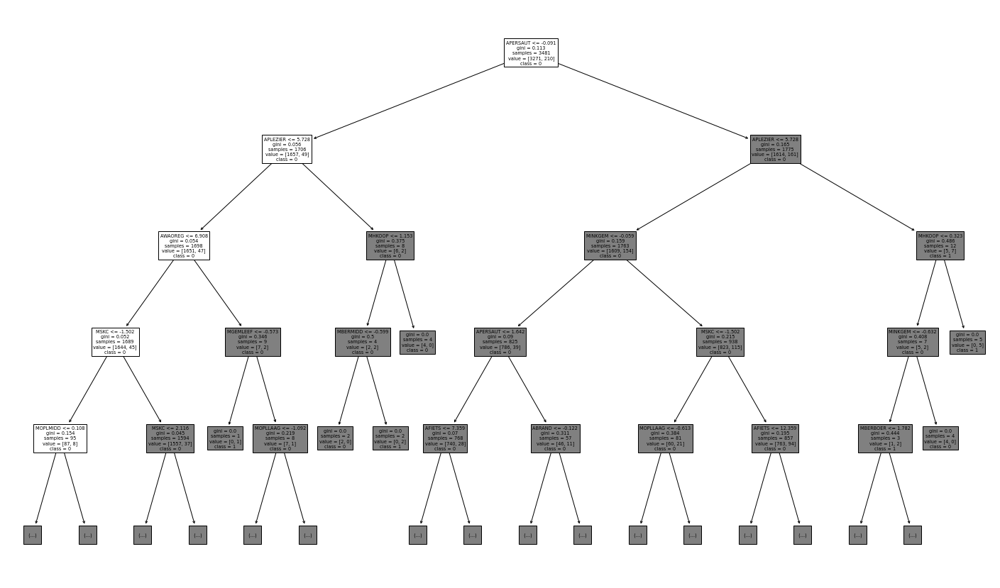

In [ ]:
#we will put a limit on the depth so we can have a better look
clf = DecisionTreeClassifier()
clf.fit(X_train_scaled,y_train)
clf.predict(X_test_scaled)

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (25,15))
tree.plot_tree(clf, max_depth = 4,  feature_names = X.columns, class_names = ['0', '1']);

+ One profile we get from this partial tree is: **(APERSAUT > -0.091) => (APLEZIER > 5.728) => (MHKOOP > 0.323) => CARAVAN =1** 

## Plotting the Decision Tree model with augmented dataset

In [ ]:
#model with augmented data
clf = DecisionTreeClassifier()
clf.fit(X_train_resampled_scaled,y_train_resampled)
clf.predict(X_test_resampled_scaled)

#plotting full tree
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (900,75))
tree.plot_tree(clf,  feature_names = X.columns, class_names = ['0', '1']);

In [ ]:
fig.savefig('DecisionTree_aug.png')